In [3]:
import numpy as np
import pandas as pd
import matplotlib

In [4]:
df = pd.read_csv('/Users/admin/Desktop/DataGlacier/Dataset/bank-full.csv', sep=';')
df.head()

df2=pd.read_csv('/Users/admin/Desktop/DataGlacier/Dataset/bank-additional-full.csv', sep = ';')
df2.head()
print(df2.to_string())

       age            job   marital            education  default  housing     loan    contact month day_of_week  duration  campaign  pdays  previous     poutcome  emp.var.rate  cons.price.idx  cons.conf.idx  euribor3m  nr.employed    y
0       56      housemaid   married             basic.4y       no       no       no  telephone   may         mon       261         1    999         0  nonexistent           1.1          93.994          -36.4      4.857       5191.0   no
1       57       services   married          high.school  unknown       no       no  telephone   may         mon       149         1    999         0  nonexistent           1.1          93.994          -36.4      4.857       5191.0   no
2       37       services   married          high.school       no      yes       no  telephone   may         mon       226         1    999         0  nonexistent           1.1          93.994          -36.4      4.857       5191.0   no
3       40         admin.   married             basi

In [5]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB
None


In [6]:
print(df2.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [ ]:
# Method 1: Mean imputation for numeric columns
numeric_columns = df2.select_dtypes(include=[np.number]).columns
df2[numeric_columns] = df2[numeric_columns].fillna(df2[numeric_columns].mean())

# Method 2: Mode imputation for categorical columns
categorical_columns = df2.select_dtypes(include=['object']).columns
df2[categorical_columns] = df2[categorical_columns].fillna(df2[categorical_columns].mode().iloc[0])

print(df2.isnull().sum())

In [ ]:
# Outlier detection and handling using IQR method
def handle_outliers(df, column):
    Q1 = df2[column].quantile(0.25)
    Q3 = df2[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df2[column] = df2[column].clip(lower_bound, upper_bound)

numeric_columns = df2.select_dtypes(include=[np.number]).columns
for column in numeric_columns:
    handle_outliers(df2, column)

print("Outliers handled for numeric columns")

In [7]:
print(df2.duplicated())

0        False
1        False
2        False
3        False
4        False
         ...  
41183    False
41184    False
41185    False
41186    False
41187    False
Length: 41188, dtype: bool


In [8]:
job=df2['job'].value_counts() 
print(job)
marriage=df2['marital'].value_counts()
print(marriage)
education=df2['education'].value_counts()
print(education)
loan=df2['loan'].value_counts()
print(loan)
poutcome=df2['poutcome'].value_counts()
print(poutcome)
outcome=df2['y'].value_counts()
print(outcome)

job
admin.           10422
blue-collar       9254
technician        6743
services          3969
management        2924
retired           1720
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
unknown            330
Name: count, dtype: int64
marital
married     24928
single      11568
divorced     4612
unknown        80
Name: count, dtype: int64
education
university.degree      12168
high.school             9515
basic.9y                6045
professional.course     5243
basic.4y                4176
basic.6y                2292
unknown                 1731
illiterate                18
Name: count, dtype: int64
loan
no         33950
yes         6248
unknown      990
Name: count, dtype: int64
poutcome
nonexistent    35563
failure         4252
success         1373
Name: count, dtype: int64
y
no     36548
yes     4640
Name: count, dtype: int64


In [9]:
freq_table = pd.crosstab(df2['poutcome'], df2['y']) 
freq_table

y,no,yes
poutcome,,
failure,3647,605
nonexistent,32422,3141
success,479,894


In [ ]:
import matplotlib.pyplot as plt
plt.hist(df2['age'])
plt.show()

In [ ]:
plt.hist(df2['pdays'])
plt.show()

In [ ]:
plt.hist(df2['previous'])
plt.show()

In [ ]:
df2['previous'].describe()

In [ ]:
df2['campaign'].describe()

In [ ]:
df2['duration'].describe()

In [41]:
from statistics import mean
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RepeatedStratifiedKFold
import sklearn
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE

In [51]:
x=df2.iloc[:, :20]
x

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6


In [64]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df2['month'] = le.fit_transform(df2['month'])
df2['day_of_week'] = le.fit_transform(df2['day_of_week'])
df2['poutcome'] = le.fit_transform(df2['poutcome'])
df2['job'] = le.fit_transform(df2['job'])
df2['marital'] = le.fit_transform(df2['marital'])
df2['education'] = le.fit_transform(df2['education'])
df2['default'] = le.fit_transform(df2['default'])
df2['housing'] = le.fit_transform(df2['housing'])
df2['loan'] = le.fit_transform(df2['loan'])
df2['contact'] = le.fit_transform(df2['contact'])
df2['y'] = le.fit_transform(df2['y'])
x=df2.iloc[:, :20]
x
y=df2['y']
y


0        0
1        0
2        0
3        0
4        0
        ..
41183    1
41184    0
41185    0
41186    1
41187    0
Name: y, Length: 41188, dtype: int64

In [65]:
x.describe()
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  int64  
 2   marital         41188 non-null  int64  
 3   education       41188 non-null  int64  
 4   default         41188 non-null  int64  
 5   housing         41188 non-null  int64  
 6   loan            41188 non-null  int64  
 7   contact         41188 non-null  int64  
 8   month           41188 non-null  int64  
 9   day_of_week     41188 non-null  int64  
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  int64  
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [67]:
#Use SMOTE to oversample the minority class
oversample = SMOTE()
over_X, over_y = oversample.fit_resample(x, y)
over_X_train, over_X_test, over_y_train, over_y_test = train_test_split(over_X, over_y, test_size=0.1, stratify=over_y)

In [91]:
#Build SMOTE SRF model
SMOTE_SRF = RandomForestClassifier(n_estimators=100, random_state=0)
#Create Stratified K-fold cross validation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
scoring = ('f1', 'recall', 'precision')
#Evaluate SMOTE SRF model
scores = cross_validate(SMOTE_SRF, over_X, over_y, scoring=scoring, cv=cv)
#Get average evaluation metrics
print('Mean f1: %.3f' % mean(scores['test_f1']))
print('Mean recall: %.3f' % mean(scores['test_recall']))
print('Mean precision: %.3f' % mean(scores['test_precision']))

Mean f1: 0.955
Mean recall: 0.968
Mean precision: 0.941


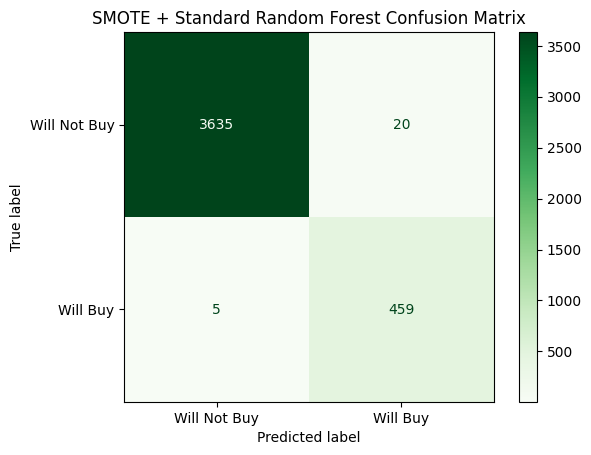

In [93]:
#Randomly spilt dataset to test and train set
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.1, stratify=y)
#Train SMOTE SRF
SMOTE_SRF.fit(over_X_train, over_y_train)
#SMOTE SRF prediction result
y_pred = SMOTE_SRF.predict(X_test)
# Create and display confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Will Not Buy', 'Will Buy'])
disp.plot(cmap='Greens')
plt.title('SMOTE + Standard Random Forest Confusion Matrix')
plt.show()

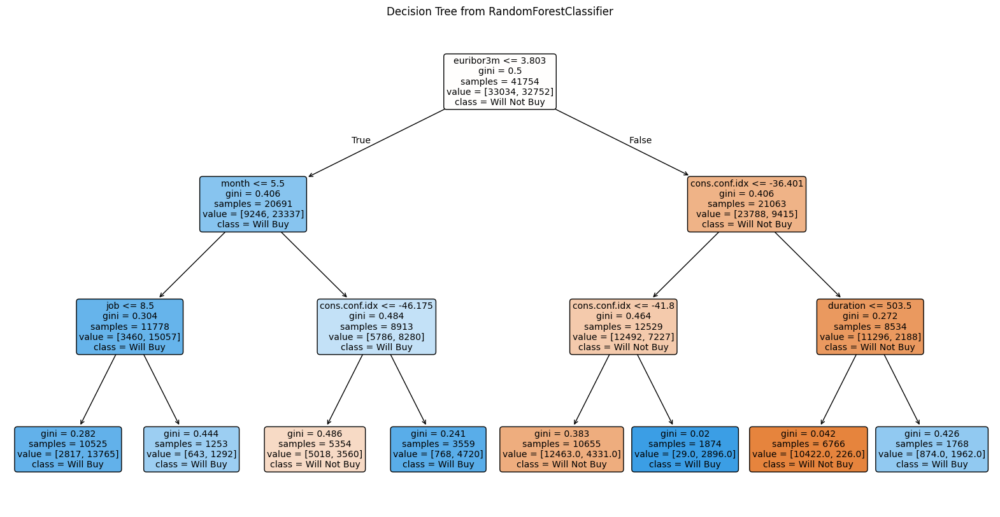

In [ ]:
#from sklearn.tree import plot_tree

# Assuming your RandomForestClassifier is named 'SMOTE_SRF'
# Extract a single tree from the forest (e.g., the first tree)
tree = SMOTE_SRF.estimators_[0]

# Plot the tree
#plt.figure(figsize=(20,10))
#plot_tree(tree, filled=True, feature_names=x.columns, class_names=['Will Not Buy', 'Will Buy'], rounded=True)
#plt.title('Decision Tree from RandomForestClassifier')
#plt.show()

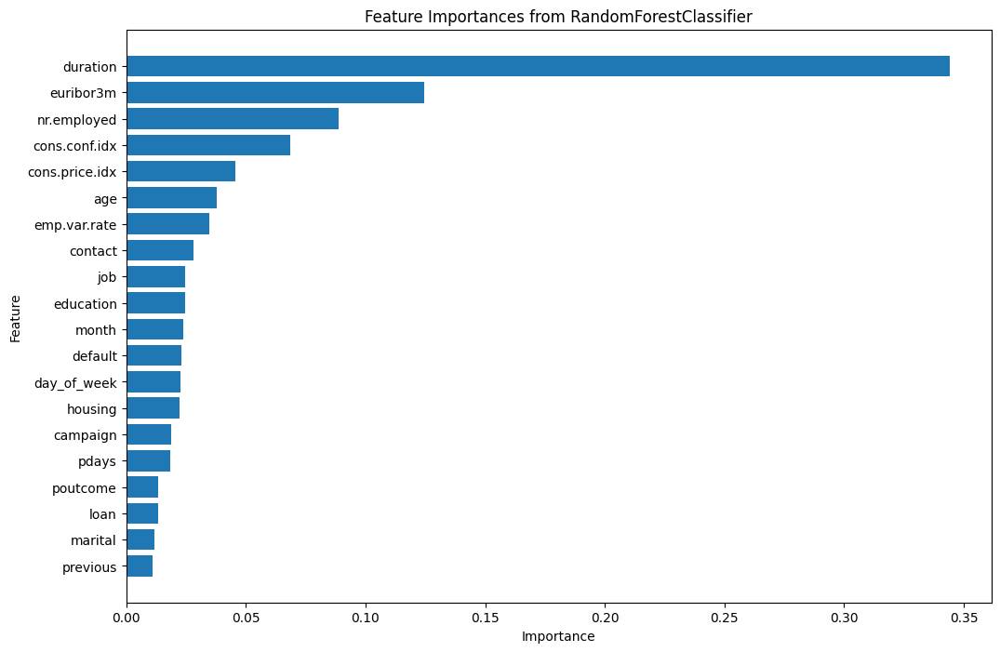

,Feature,Importance
10,duration,0.344292
18,euribor3m,0.124702
19,nr.employed,0.088925
17,cons.conf.idx,0.068361
16,cons.price.idx,0.045787
0,age,0.037734
15,emp.var.rate,0.034795
7,contact,0.027936
1,job,0.024693
3,education,0.024454


In [94]:
# Extract feature importances
feature_importances = SMOTE_SRF.feature_importances_

# Create a DataFrame for better visualization
features = pd.DataFrame({
    'Feature': x.columns,
    'Importance': feature_importances
})

# Sort the DataFrame by importance
features = features.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
plt.barh(features['Feature'], features['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances from RandomForestClassifier')
plt.gca().invert_yaxis()
plt.show()

# Display the feature importances DataFrame
features

In [104]:
features=df2[['duration','euribor3m','nr.employed','cons.conf.idx','cons.price.idx']]
print(features)
Model = RandomForestClassifier(n_estimators=100, random_state=0, max_depth=3)
Model.fit(features,y)

       duration  euribor3m  nr.employed  cons.conf.idx  cons.price.idx
0           261      4.857       5191.0          -36.4          93.994
1           149      4.857       5191.0          -36.4          93.994
2           226      4.857       5191.0          -36.4          93.994
3           151      4.857       5191.0          -36.4          93.994
4           307      4.857       5191.0          -36.4          93.994
...         ...        ...          ...            ...             ...
41183       334      1.028       4963.6          -50.8          94.767
41184       383      1.028       4963.6          -50.8          94.767
41185       189      1.028       4963.6          -50.8          94.767
41186       442      1.028       4963.6          -50.8          94.767
41187       239      1.028       4963.6          -50.8          94.767

[41188 rows x 5 columns]


RandomForestClassifier(max_depth=3, random_state=0)

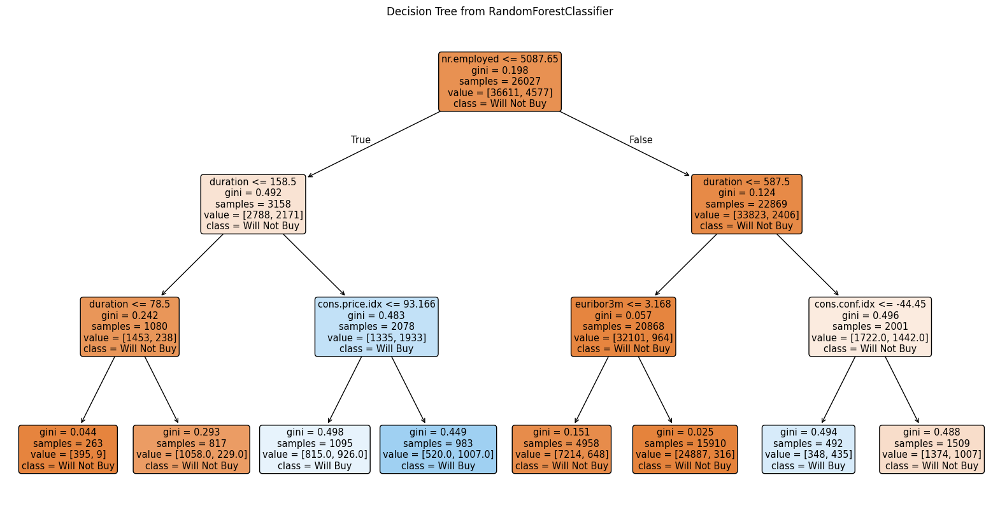

In [106]:
from sklearn.tree import plot_tree
# Extract a single tree from the forest (e.g., the first tree)
tree = Model.estimators_[0]

# Plot the tree
plt.figure(figsize=(20,10))
plot_tree(tree, filled=True, feature_names=features.columns, class_names=['Will Not Buy', 'Will Buy'], rounded=True)
plt.title('Decision Tree from RandomForestClassifier')
plt.show()